# Lab 3: Image Color Models, Noise Addition and Filtering

## Objectives:
1. Convert images between different color models
2. Add various types of noise to images
3. Apply linear and non-linear filters for noise reduction
4. Analyze filter performance with different mask sizes

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise
from PIL import Image



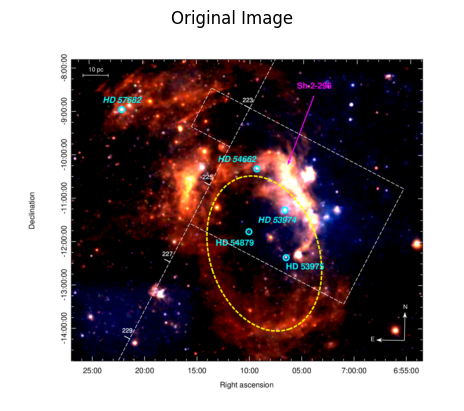

In [15]:
import cv2
import matplotlib.pyplot as plt


image = cv2.imread('space.png')


image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
   
plt.imshow(image_rgb)
plt.axis('off')
plt.title('Original Image')
plt.show()

## 3.1 Color Model Conversions

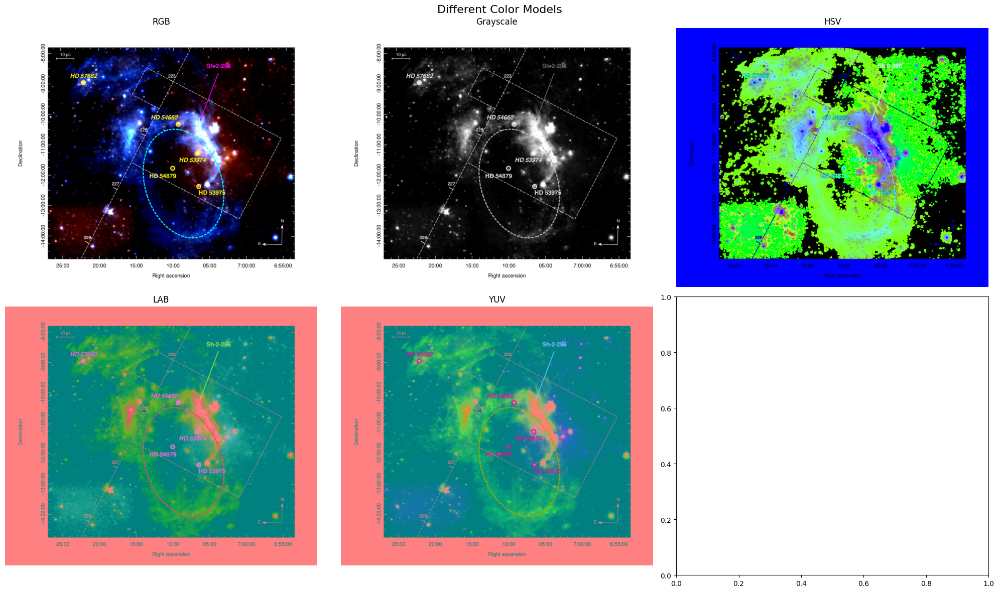

In [16]:
def convert_and_display_color_models(img):
    
    # Create subplots
    fig, axs = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('Different Color Models', fontsize=16)
    
    # RGB (Original)
    axs[0, 0].imshow(img)
    axs[0, 0].set_title('RGB')
    axs[0, 0].axis('off')
    
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    axs[0, 1].imshow(gray, cmap='gray')
    axs[0, 1].set_title('Grayscale')
    axs[0, 1].axis('off')
    
    # HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    axs[0, 2].imshow(hsv)
    axs[0, 2].set_title('HSV')
    axs[0, 2].axis('off')
    
    # LAB
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    axs[1, 0].imshow(lab)
    axs[1, 0].set_title('LAB')
    axs[1, 0].axis('off')
    
    # YUV
    yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    axs[1, 1].imshow(yuv)
    axs[1, 1].set_title('YUV')
    axs[1, 1].axis('off')
    
    
    
    plt.tight_layout()
    plt.show()

convert_and_display_color_models(image)

## 3.2 Noise Addition and Filtering

In [17]:
def add_noise(img, noise_type, density=0.05):
    """Add different types of noise to the image"""
    if noise_type == 'gaussian':
        noisy = random_noise(img, mode='gaussian', var=density)
    elif noise_type == 'salt_pepper':
        noisy = random_noise(img, mode='s&p', amount=density)
    elif noise_type == 'poisson':
        noisy = random_noise(img, mode='poisson')
    elif noise_type == 'speckle':
        noisy = random_noise(img, mode='speckle', var=density)
    return (noisy * 255).astype(np.uint8)



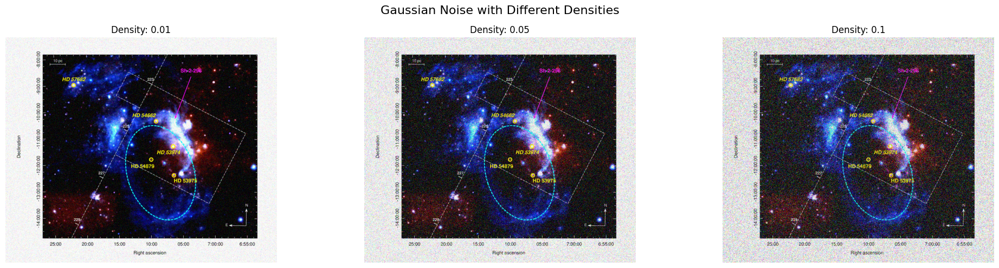

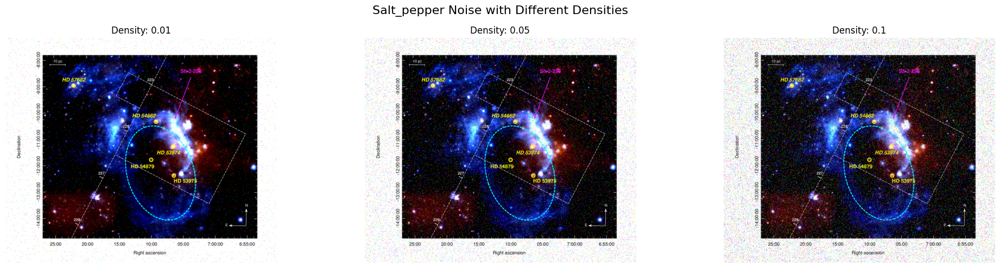

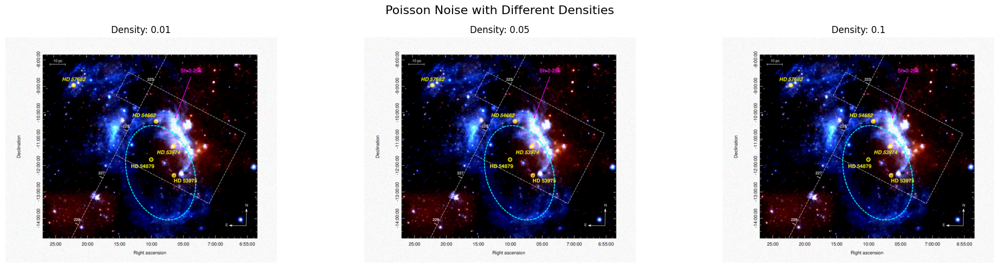

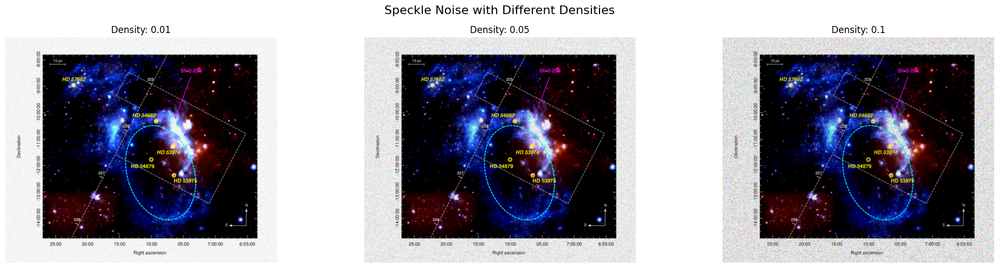

In [18]:

noise_types = ['gaussian', 'salt_pepper', 'poisson', 'speckle']
densities = [0.01, 0.05, 0.1]


for noise_type in noise_types:
    plt.figure(figsize=(20, 5))
    plt.suptitle(f'{noise_type.capitalize()} Noise with Different Densities', fontsize=16)
    
    for idx, density in enumerate(densities):
        plt.subplot(1, 3, idx + 1)
        noisy_img = add_noise(image, noise_type, density)
        plt.imshow(noisy_img)
        plt.title(f'Density: {density}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

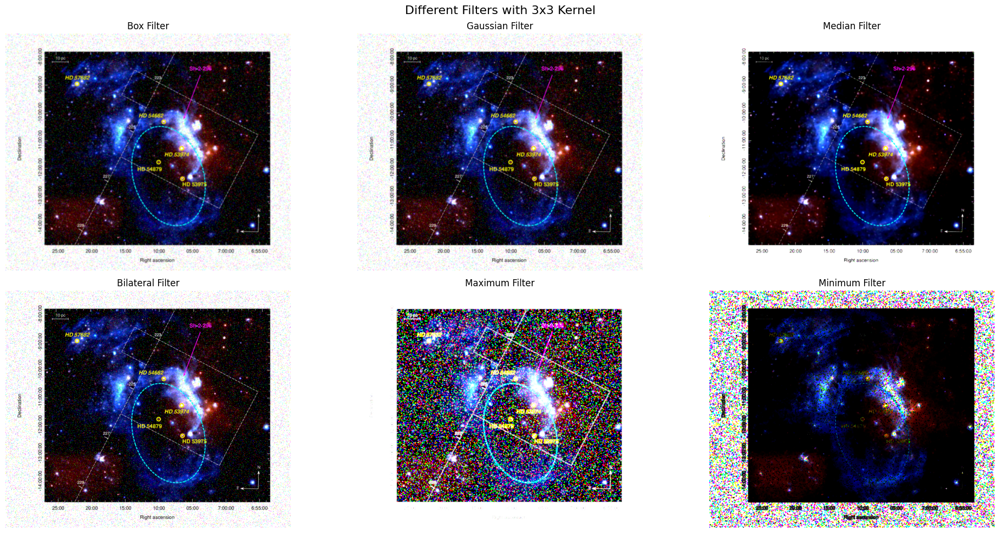

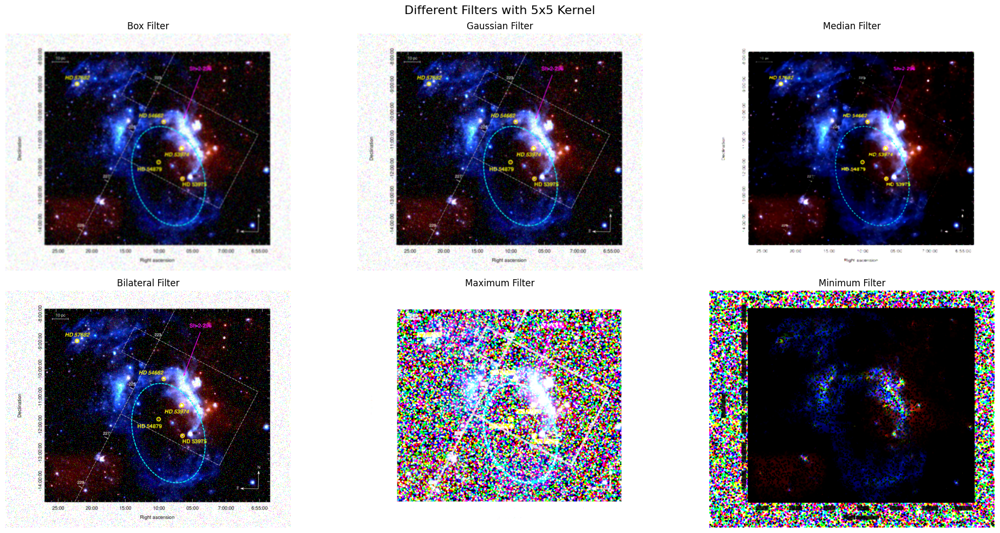

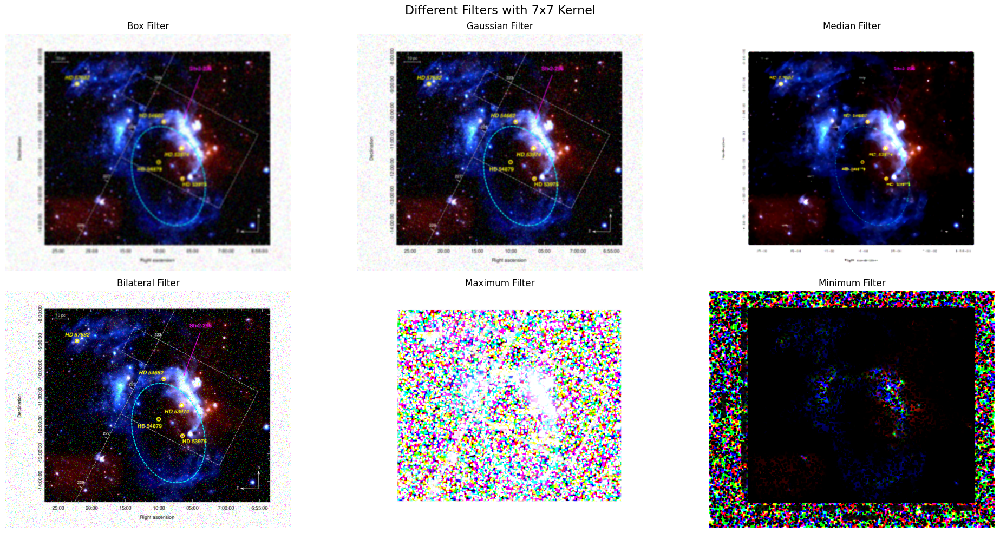

In [19]:
def apply_filters(img, kernel_sizes=[3, 5, 7]):
    
    for k_size in kernel_sizes:
        plt.figure(figsize=(20, 10))
        plt.suptitle(f'Different Filters with {k_size}x{k_size} Kernel', fontsize=16)
        
        # Box/Average
        box = cv2.blur(img, (k_size, k_size))
        plt.subplot(231)
        plt.imshow(box)
        plt.title('Box Filter')
        plt.axis('off')
        
        # Gaussian 
        gaussian = cv2.GaussianBlur(img, (k_size, k_size), 0)
        plt.subplot(232)
        plt.imshow(gaussian)
        plt.title('Gaussian Filter')
        plt.axis('off')
        
        # Median 
        median = cv2.medianBlur(img, k_size)
        plt.subplot(233)
        plt.imshow(median)
        plt.title('Median Filter')
        plt.axis('off')
        
        # Bilateral filter
        bilateral = cv2.bilateralFilter(img, k_size, 75, 75)
        plt.subplot(234)
        plt.imshow(bilateral)
        plt.title('Bilateral Filter')
        plt.axis('off')
        
        # Maximum 
        max_filtered = cv2.dilate(img, np.ones((k_size, k_size), np.uint8))
        plt.subplot(235)
        plt.imshow(max_filtered)
        plt.title('Maximum Filter')
        plt.axis('off')
        
        # Minimum filter
        min_filtered = cv2.erode(img, np.ones((k_size, k_size), np.uint8))
        plt.subplot(236)
        plt.imshow(min_filtered)
        plt.title('Minimum Filter')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Create a noisy image with salt & pepper noise
noisy_image = add_noise(image, 'salt_pepper', 0.05)

# Apply filters with different kernel sizes
apply_filters(noisy_image)

1. **Color Models**:
   - RGB is the standard color model for digital displays
   - CMYK is primarily used for printing purposes
   - LAB provides perceptually uniform color space
   - HSV separates color information from intensity

2. **Noise Types**:
   - Gaussian noise affects all pixels with normal distribution
   - Salt & Pepper noise appears as random white and black pixels
   - Poisson noise is signal-dependent
   - Speckle noise is multiplicative noise

3. **Filter Performance**:
   - Linear filters (Box, Gaussian) work well for Gaussian noise
   - Median filter is excellent for Salt & Pepper noise
   - Bilateral filter preserves edges while removing noise
   - Larger kernel sizes provide more smoothing but may blur details

4. **Applications**:
   - Color model conversion is crucial for cross-media compatibility
   - Noise reduction is essential in image processing pipelines
   - Filter selection depends on noise type and application requirements